# Henry Gu - Advanced Machine Learning Assignment 4 - Generative Adversarial Networks / BigGAN

In the class demo we have seen an example where we hold the truncation factor and the noise constant, while smoothly changing the class vector from one class to another. In this assignment, let's explore what will happen if we change the truncation factor and the noise, while holding the class vector constant.

This assignment consists of the following tasks required to achieve the goal described above:

1. Generate 10 different truncation factors in the interval (0, 1].
2. For each truncation factor, generate 5 different noise vectors using that truncation factor.
3. Create one-hot-encoded vector for the class label "mushroom". 
4. Given all the inputs, generate and plot 50 different images of mushrooms.
5. Make a conclusion about relationship between the truncation factor and the model output.

Since this assignment is 20 points, each task is 4 points. Throughout this assignment, you may copy/call any code from the class material, including Jupyter notebooks and utils.py file.

While not required to accomplish this assignment, reading the original paper may help gaining a deeper understanding of this model's inner workings. https://arxiv.org/abs/1809.11096

In [1]:
# !bash -l -c "conda activate ucla_deeplearning && pip install tensorflow-estimator==2.2.0"

## Initialize Tensorflow Instance

In [2]:
# Tensorflow module path for 512x512 BigGAN-deep
module_path = 'https://tfhub.dev/deepmind/biggan-deep-512/1'    

# Assignment hyperparams
factors_count = 10
samples_per_factor = 5
samples_count = factors_count * samples_per_factor

In [3]:
import io

import numpy as np
import pandas as pd

import PIL.Image
import IPython.display

import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()

import tensorflow_hub as hub

from utils import *

Instructions for updating:
non-resource variables are not supported in the long term


In [4]:
# # Run this cell to configure Tensorflow to use your GPU
# for gpu in tf.config.experimental.list_physical_devices('GPU'):
#     print(gpu)
#     tf.config.experimental.set_memory_growth(gpu, True)

In [5]:
module = hub.Module(module_path)

inputs = {
    k: tf.placeholder(v.dtype, v.get_shape().as_list(), k)
    for k, v in module.get_input_info_dict().items()
}

output = module(inputs)

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [6]:
# Tensor z holds the random noise for each image to be generated.
noise_in = inputs['z']
dim_noise = noise_in.shape.as_list()[1]

# Tensor y is the one-hot-encoded class for each image to be generated.
class_in = inputs['y']
dim_class = class_in.shape.as_list()[1]

# Scalar between 0 and 1 that is the truncation factor of the noise.
trunc_in = inputs['truncation']

{n: t.shape for n, t in inputs.items()}

{'y': TensorShape([Dimension(None), Dimension(1000)]),
 'z': TensorShape([Dimension(None), Dimension(128)]),
 'truncation': TensorShape([])}

In [7]:
output

<tf.Tensor 'module_apply_default/G_trunc_output:0' shape=(?, 512, 512, 3) dtype=float32>

In [8]:
sess = tf.Session()

initializer = tf.global_variables_initializer()
sess.run(initializer)

2021-10-26 02:44:15.641568: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcuda.so.1
2021-10-26 02:44:16.172453: E tensorflow/stream_executor/cuda/cuda_driver.cc:313] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2021-10-26 02:44:16.172525: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (ip-172-16-58-112): /proc/driver/nvidia/version does not exist
2021-10-26 02:44:16.174528: I tensorflow/core/platform/cpu_feature_guard.cc:143] Your CPU supports instructions that this TensorFlow binary was not compiled to use: SSE4.1 SSE4.2 AVX AVX2 AVX512F FMA
2021-10-26 02:44:16.597309: I tensorflow/core/platform/profile_utils/cpu_utils.cc:102] CPU Frequency: 2499995000 Hz
2021-10-26 02:44:16.598914: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x55b6aafebcd0 initialized for platform Host (this does not guarantee that XLA will 

# Task 1

In this task, you need to generate an array of 10 different truncation factors in the interval (0, 1].
Note that factor = 0 is invalid because the distribution collapses to a single possible value. Factor can be as close to zero as you would like, however. 

An excellent idea is to use this function: https://docs.scipy.org/doc/numpy/reference/generated/numpy.linspace.html

Expected shape of the array: `(10,)`

In [9]:
# Enter your code for task 1 here.
# Create additional cells directly below this one, if needed.
import numpy as np

truncation_factors = np.linspace(0.00001, 1, factors_count)
print(truncation_factors.shape)
truncation_factors

(10,)


array([1.0000e-05, 1.1112e-01, 2.2223e-01, 3.3334e-01, 4.4445e-01,
       5.5556e-01, 6.6667e-01, 7.7778e-01, 8.8889e-01, 1.0000e+00])

# Task 2

Great, let's make some noise now!

You need to generate an array of noise vectors. However, now is also a good time to talk about the batch size. Recall that the truncation factor is used to generate the noise, but it's also an input to the model itself. Even though, the goal is to generate 50 images, the model is using the same truncation factor for all images generated in a single batch. This means that to generate images for 10 different truncation factors, you will need to evaluate the model with 10 separate batches. In summary, you need 10 batches with 5 noise vectors in each batch. 

Useful functions for this task:
* `random.randint`
* `random_noise` from BigGAN.ipynb
* `numpy.concatenate`
* `numpy.reshape`

Expected shape of the array: `(10, 5, 128)`

In [10]:
# Enter your code for task 2 here.
# Create additional cells directly below this one, if needed.

In [11]:
from scipy.stats import truncnorm

def random_noise(batch_size=10, truncation_factor=1, truncation_threshold=2, seed=100):
    """
    Returns a 2-d array of random noise.
    
    Normal distribution with mean = 0 and std = 1 is truncated to
    range defined as [-threshold * factor, threshold * factor].
    """
    state = np.random.RandomState(seed)
    
    random_z = truncnorm.rvs(
        -truncation_threshold * truncation_factor, 
        truncation_threshold * truncation_factor, 
        size=(batch_size, dim_noise), 
        random_state=state
    )
    
    return random_z

In [12]:
noise_arr = []
seed = 100
for truncation_factor in truncation_factors:
    noise = random_noise(batch_size=samples_per_factor, truncation_factor=truncation_factor, seed=seed)
    noise_arr.append(noise)
noise_arr = np.array(noise_arr)
noise_arr.shape

(10, 5, 128)

# Task 3

Amazing work! Let's take care of the mushrooms now.

You need a one-hot-encoded array that corresponds to the mushroom class. As we have discussed in the previous task, there will be 10 batches of samples. In each batch, there are 5 samples, but all of them have the same class.

Useful functions for this task:
* `get_classes`
* `class_labels_to_ids`
* `class_ids_to_one_hot`
* `numpy.repeat`

Expected shape of the array: `(10, 5, 1000)`

In [13]:
# Enter your code for task 3 here.
# Create additional cells directly below this one, if needed.

In [14]:
import json

def get_classes():
    """
    Returns a Pandas Series, where values are class labels and the index consists of class IDs.
    """
    with open('./biggan_classes.json') as f:
        classes = json.loads(f.read())
    classes = [c.split(') ')[1] for c in classes]
    classes = pd.Series(classes)
    return classes

# See docs: https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.OneHotEncoder.html
from sklearn.preprocessing import OneHotEncoder

class_encoder = OneHotEncoder(categories='auto')
class_encoder.fit(np.arange(dim_class).reshape(-1, 1))

def class_labels_to_ids(class_labels):
    """
    Converts an iterable of class labels into Numpy array of class IDs.
    
    Expected global variable: classes
    """
    return np.array([(classes == c).idxmax() for c in class_labels])


def class_ids_to_one_hot(class_ids):
    """
    Converts a 1-d array of class IDs into 2-d array of one-hot-encoded classes.
    
    Expected global variable: classes
    """
    class_ids = class_ids.reshape(-1, 1)
    class_ohs = class_encoder.transform(class_ids)
    return class_ohs.toarray()

In [15]:
classes = get_classes()
class_id = class_labels_to_ids(['mushroom'])
class_oh = class_ids_to_one_hot(class_id)
class_oh = np.repeat(class_oh, samples_count, axis=0).reshape(factors_count,samples_per_factor,1000)
class_oh.shape

(10, 5, 1000)

# Task 4

Very exciting! We are ready to take a walk in the forest.

You now have three arrays (class, noise, factor) with inputs for each of the 10 batches. 

Here are the steps for this task:
1. Iterate over input arrays and feed the Tensorflow model with one batch a time.
2. Collect the output of BigGAN for each batch into a list.
3. Concatenate the list into a single 4-dimensional array of images.
4. Plot the images in a grid.

Running the model should take about 1-2 mins with 8-core CPU. This step will also require up to 10GB of RAM. It's highly recommended to run this in the cloud.

Plot images in a grid, where each row has the same truncation factor but different random noise.

Useful functions for this task:
* `generate_images`
* `numpy.concatenate`
* `plot_strided_grid`

In [16]:
# Enter your code for task 4 here.
# Create additional cells directly below this one, if needed.

In [17]:
def generate_images(classes, noises, truncation_factor, batch_size=10):
    """
    Generates the images from given model inputs.
    100 of 512x512 images take ~2 minutes on 8-core CPU.
    
    Computation is performed in batches to avoid running out of RAM.
    Note that the required RAM is an affine function of the batch size.
    From empirical evidence, batch size of 5 with 512x512 images will use ~10GB RAM.
    
    Note that all images are generated with the same truncation factor.
    
    Expected global variables: sess, output
    """
    
    # Count of images to be generated.
    n = classes.shape[0]

    # Indexes of the first image to be generated in each batch.
    starts = np.arange(0, n, batch_size)
    
    outputs = []
    for start in starts:
        batch_idx = slice(start, start+batch_size)
            
        feed_dict = {
            noise_in: noises[batch_idx], 
            class_in: classes[batch_idx], 
            trunc_in: truncation_factor
        }

        outputs.append(sess.run(output, feed_dict=feed_dict))
        
    outputs = np.concatenate(outputs)
    
    # Rescales from floats in [-1, 1] to ints in [0, 255].
    images = ((outputs + 1) * 127).astype('uint')
    
    return images

In [18]:
img_out = []
for i in range(factors_count):
    images = generate_images(class_oh[i], noise_arr[i], truncation_factors[i], batch_size=1)
    img_out.append(images)
len(img_out)

10

In [19]:
images = img_out[0]
for i in range(1,len(img_out)):
    images = np.concatenate((images, img_out[i]))
images.shape

(50, 512, 512, 3)

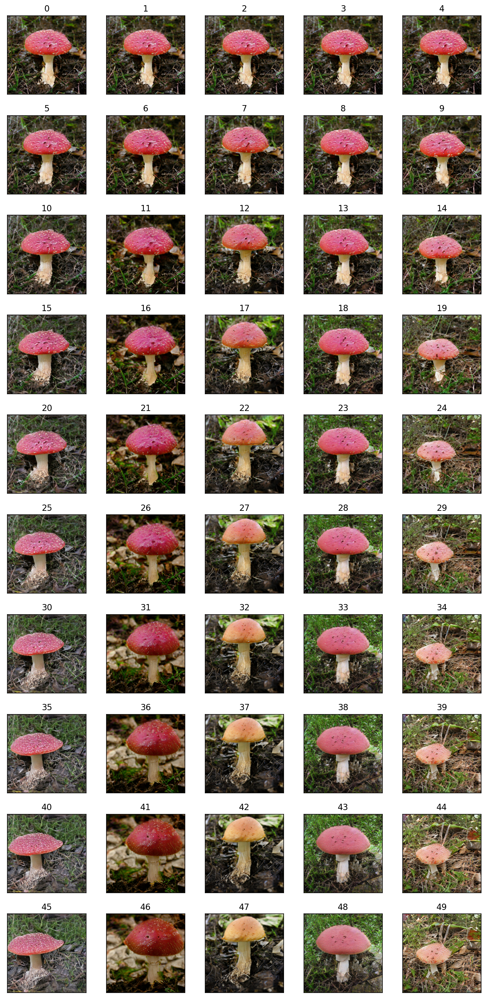

In [20]:
plot_strided_grid(images, ncols=samples_per_factor, nrows=factors_count)

### Generate a batch of high-variance images

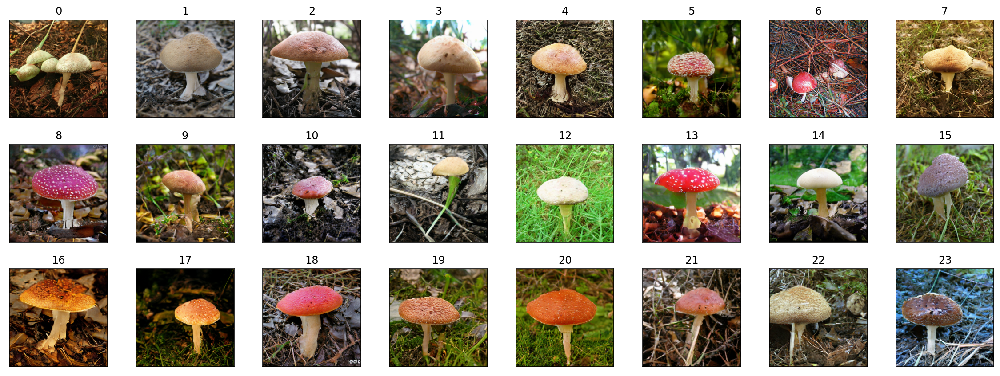

In [21]:
images_high_variance = generate_images(class_oh.reshape(-1,1000)[:24], random_noise(batch_size=24, truncation_threshold=3, truncation_factor=1, seed=888), 1, batch_size=1)
plot_strided_grid(images_high_variance, ncols=8, nrows=3)

### Generate a batch of low-variance images

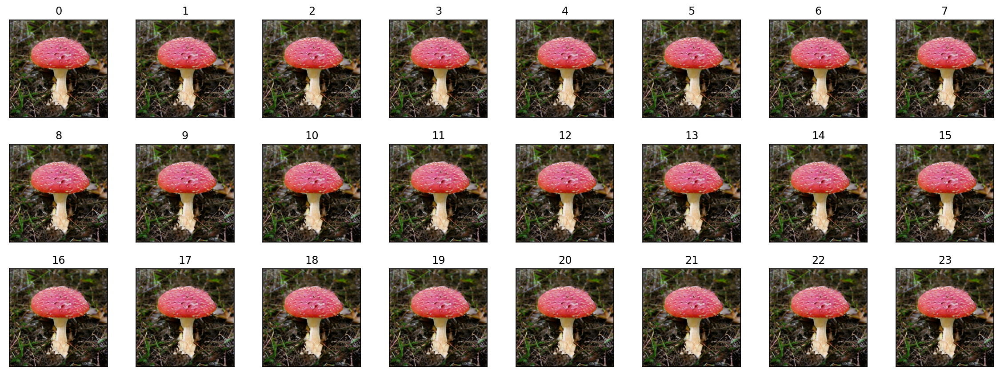

In [22]:
images_low_variance = generate_images(class_oh.reshape(-1,1000)[:24], random_noise(batch_size=24, truncation_threshold=2, truncation_factor=0.0001, seed=888), 0.0001, batch_size=1)
plot_strided_grid(images_low_variance, ncols=8, nrows=3)

# Task 5

Wow, so many mushrooms. 

This has been an amazing adventure, let's make some conclusions.
Here are some questions that you should answer, but also feel free to add any other thoughts that you have:
1. What's the relationship between truncation and image diversity?
2. What's the relationship between truncation and image quality?
3. Have you seen any extremely unusual samples in the batch?
4. Why is truncation affecting the batch in this way?

If it's not quite clear what to make out of the 50 images, re-run the procedure with a different seed / more truncation factors to see the trend. Repeat until a pattern starts to emerge. If you have created the noise vectors as required, you should see the pattern within 2-3 batches.

# Conclusions
1. We notice that there is a clear relationship between truncation and image diversity. With a very small truncation factor near 0, the image diversity drops significantly, whereby all the images generated are almost identical (see the first row of the image output). This makes sense since we are restricting the range of the distribution from which the model samples random noise vectors. Therefore, we are likely to get 5 very similar noise vectors which contain similar information for the generator. For example, the first row of the output corresponds to the case where we use a truncation factor of 0.00001. Thus, with such a truncated distribution we are likely to sample 5 vectors which are all very close to the mean of the distribution, 0. Since each of the input vectors are very similar, we observe very similar output images. We observe in the bottom row a much more diverse range of mushrooms when the truncation factor is increased, and thus the input noise vectors contain more differences.

2. We notice a subtle decline in image quality across the images generated as part of the assignment as the truncation factor is increased. In the bottom row, we notice slight blurriness and loss of details in images 47 - 49. We expect this outcome as a higher truncation factor means we are likely to sample random noise vectors that the model may not have seen as often during training. That is, since we generate input noise vectors which have a lower probability of being sampled, the model may have had less training on similar noise vectors. Thus, the model may have a reduced ability to generate an accurate image based on the noise vector. In contrast, if we sample a random noise vector close to the mean of the distribution, the model has likely seen a similar vector much more frequently during training and therefore is able to generate a higher quality image.

3. In the original sample of 50 images, we do not observe too many extremely unusual samples in the batches. This may be due to a relatively high level of truncation with the default function settings and a relatively low sample size per batch. In the final section of the notebook, I generated an additional sample of 24 images with a truncation threshold of 3 and a truncation factor of 1 to increase the potential for image diversity at the cost of image quality to observe if we would generate any unusual samples. In this batch, we notice some unusual colouring for certain images (e.g. 7, 20, 23). We also notice some loss of detail in many images (e.g. 11, 12 15). To test a counterexample, I also generated 24 additional images with a low truncation factor. As expected, we notice that the 24 images in this batch are all relatively consistent.

4. Truncation is affecting this batch in this way because it is restricting the range of the normal distribution from which a random noise vector can be sampled. That is, a smaller truncation factor means that we are restricting the range of the normal distribution from which we sample our input noise vectors to a range much closer to the mean of the distribution (in this case 0). This means that we will get input noise vectors that are much more similar to each other. Since the GAN uses the information in the input vector to generate the output image, by truncating the input and thus generating noise vectors which are quite similar, we are forcing the GAN to output similar images as the input information is more similar. If we increase the truncation factor and allow the input vector to be sampled from a greater range, we will generate more diversity in the input noise vector and thus enable different image outputs, since the information inherently encoded in the input vector will be more dispersed. However, by allowing more diversity by increasing the range, we also increase the chance of drawing a sample noise vector that the GAN is less able to handle as it has not seen as much similar training data. Thus the output image is more likely to be of a lower quality when the truncation factor is increased. Thus overall, we observe that more truncation (i.e. smaller truncation factor) leads to better image quality at the cost of image diversity. Thus image quality and image diversity and inversely correlated for this model. 